<a href="https://colab.research.google.com/github/belmont358/Lab-2-web/blob/master/MiniProyecto_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **MiniProyecto 1**

**Por:**

* **Fredy Mauricio Ríos Sánchez CC: 98696437**

* **Jesus rafael Vellojin CC: 1067918748**


* **Fabian Ospina CC: 1036663618**

## **Análisis Multivariado de Señales Sismográficas**

**Tratamiento de Señales III**

**Facultad de Ingeniería**

**Universidad de Antioquia**

2021


#**1. Carga de drive y librerías**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


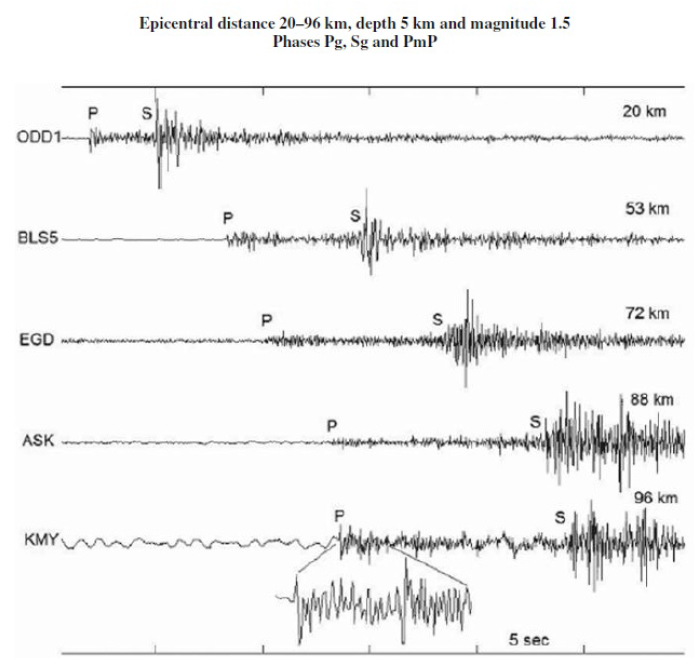

Los observatorios sismológicos clasifican las señales sísmicas de acuerdo a la diferencia de tiempo de arribo entre la onda P y la onda S, conocida como S-P. La S-P, es una indicación de la distancia que existe desde el punto donde se genera el sismo al punto donde se encuentra la estación que lo registra, es decir de la distancia epicentral. Dicho parámetro, aplicado a las señales registradas
por el OSQ permite definir tres tipos de sismos: local, caracterizado por tener una S-P menor a 20 s; regional cuya S-P varía entre 20 s y 180 s y telesismo, cuya S-P es mayor 180 s.

In [2]:
# Cargue su unidad de Drive
from google.colab import drive
drive.mount('/content/gdrive')
#/content/gdrive/MyDrive/LAB_TSIII2021/DATOS_mini
%cd '/content/gdrive/MyDrive/LAB_TSIII2021/DATOS_mini'

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1xGq69IhDmCBxAMKAutdm8dzdfVxpV7cu/LAB_TSIII2021/DATOS_mini


In [3]:
!pip install pyts

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from pyts.decomposition import SingularSpectrumAnalysis
import scipy.io as sc
from scipy import signal
import scipy.integrate as integrate
import pandas as pd
import seaborn as sns

# **2. Funciones a utilizar**




## **Fuición que se encarga de  filtrar entre [1 - 50] Hz, la conconformacionn en grupos de las señales singulares y el espectro STFT, ademas de calcular todas las caracteristicas(Energia, MPotencia, MFrecuencia, varianza, Vedia, Maximo y Minimo).** 

## * *La fórmula a usar para el cálculo de la energía de cada una de las señales singulares fue:*


> 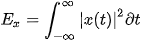





In [23]:
def sismo(n, data, g):
  
    # Captura de datos de BD y extraccion de las señales sísmicas

    data.keys()  #Variables del diccionario
    lista=[]
    Y = data['Y']  #Conjunto de señales de 21 sismos
    fs = data['fs']
    sampleSignal = Y[n,:]  #Se extrae una señal "n" de "Y"

    # Filtrado de las señales originales con pasabandas [1 - 50] Hz

    fsf = 100
    fci = 1
    fcs = 48
    
    b, a = signal.butter(4, [fci, fcs], btype='bandpass',analog=False,fs=fsf ) #Se obtienen los coeficientes del filtro Butter de orden 4

    Yfiltrado = signal.filtfilt(b, a, Y)  #Se realiza el proceso de fittrado con filtro Filt-Filt

    # Extracción de señales singulares en G grupos
    
    X = Yfiltrado
    ssa = SingularSpectrumAnalysis(window_size=g)
    X_ssa = ssa.fit_transform(X)
    idSignal = n
    XSig = X_ssa[n,:] # se extrae una señal de la base de datos


    # STFT para llevar al dominio de la frecuencia las señales singulares

    fst = 100
    lista.insert(0,Y.T)#no necesita nada mas 
    lista.insert(1,Yfiltrado.T)#no necesita nada mas
    lista.insert(2,Y[n,:])#no necesita nada mas
    lista.insert(3,Yfiltrado[idSignal])
    lista.insert(4,XSig.T)
    
    for j in range (0,g):
      f, t, Zxx = signal.stft(X_ssa[n,j], fst, nperseg=512)
      lista.insert(5+3*j,f)
      lista.insert(6+3*j,t)
      lista.insert(7+3*j,Zxx)
    # Característica 

    energ = np.zeros((21,g))  #Inicializa toda la matriz de energía en ceros        
    Matriz_Pmax = np.zeros((21,g))
    Matriz_fPmax = np.zeros((21,g))
    varP= np.zeros((21,g))
    maxP= np.zeros((21,g))
    varf= np.zeros((21,g))
    max_f=np.zeros((21,g))
    mediaP=np.zeros((21,g))
    mediaf=np.zeros((21,g))
    minP= np.zeros((21,g))
    min_f=np.zeros((21,g))


    for i in range (0,21):
      for j in range (0,g):
      
        # 1. Energía de las señales singulares
        muestra = len(X_ssa[i,j])
        dt = 1/fst
        T = np.arange(0,muestra*dt,dt)
        cuadrado = np.abs(X_ssa[i,j])**2  #cuadrado de la señal para el integral de energía
        
        energ[i][j]=  integrate.simps(cuadrado,T)  #Integrando a partir de muestras de la señal  

        # 2. Potencia máxima y frecuencia maxima a lo largo del tiempo
        f, t, Zxx = signal.stft(X_ssa [i,j], fst, nperseg=512)
        absZxx= np.abs(Zxx)
        Pmax_Zxx = np.max(absZxx) 
        Matriz_Pmax[i][j]=20*np.log10(Pmax_Zxx) #Unidades en dB 
      
        id = np.where(absZxx==Pmax_Zxx)
        fPmax_Zxx =np.squeeze(f[id[0]])
        Matriz_fPmax[i][j]=fPmax_Zxx
    
        # 3. Máximos para cada frecuencia
        maximos = 20*np.log10(np.max(absZxx,axis=1))  #Unidades en dB 
        idx_Pot_ord = np.argsort(maximos)
        idx_Pot_ord = idx_Pot_ord[-10:]
        frec=f[idx_Pot_ord]

        # 4. Mínimos para cada frecuencia
        minimos = 20*np.log10(np.min(absZxx,axis=1))  #Unidades en dB 
        idx_Pot_ord2 = np.argsort(minimos)
        idx_Pot_ord2 = idx_Pot_ord2[-4:]
        frec2=f[idx_Pot_ord2]

        # 5. Varianza, potencia máxima, frecuencia máxima y mediana
        varP[i][j] = np.var(maximos) # variansa de las potencias
        varf[i][j] = np.var(frec) # variansa de las frecuencias
        maxP[i][j] = np.max(maximos) # potencia maxima de las frecuencias
        max_f[i][j] =np.max(frec) # frecuencia maxima
        mediaP[i][j]=np.mean(maximos) #media de la potencia
        mediaf[i][j]=np.mean(frec) #media de la frecuencia
        minP[i][j] = np.min(minimos) # potencia minima de las frecuencias
        min_f[i][j] =np.min(frec2) # frecuencia minimas
  
    return (lista, energ,Matriz_Pmax,Matriz_fPmax,varP,varf,maxP,max_f,mediaP,mediaf,minP,min_f)
    

##**Funcion que se encarga de retornar la matriz de caracteristicas de las señales singulares.**

In [6]:
def gruposSingulares(num, g):
  data = sc.loadmat('sisLoc.mat')
  data1 = sc.loadmat('sisReg.mat')
  data2 = sc.loadmat('sisTele.mat')

  lista,en,px,MF,var_p,var_f,max_p,maxf,media_p,media_f,min_p,minf= sismo(num, data, g)
  lista1,en1,px1,MF1,var_p1,var_f1,max_p1,maxf1,media_p1,media_f1,min_p1,minf1= sismo(num, data1, g)
  lista2,en2,px2,MF2,var_p2,var_f2,max_p2,maxf2,media_p2,media_f2,min_p2,minf2= sismo(num, data2, g)

  energia_total=np.concatenate((en,en1,en2),axis=0)
  potenciaT_total=np.concatenate((px,px1,px2),axis=0)
  frecuenciaT_total=np.concatenate((MF,MF1,MF2),axis=0)
  varianzaT_potencia=np.concatenate((var_p,var_p1,var_p2),axis=0)
  #variansaT_frecuencia=np.concatenate((var_f,var_f1,var_f2),axis=0)
  potenciaMAX_SPG_TOTAL=np.concatenate((max_p,max_p1,max_p2),axis=0)
  #frecuenciaMAX_SPG_TOTAL=np.concatenate((maxf,maxf1,maxf2),axis=0)
  media_potencia_total=np.concatenate((media_p,media_p1,media_p2),axis=0)
  #mediana_frecuencia_total=np.concatenate((media_f,media_f1,media_f2),axis=0)
  potenciaMIN_SPG_TOTAL=np.concatenate((min_p,min_p1,min_p2),axis=0)
  #frecuenciaMIN_SPG_TOTAL=np.concatenate((minf,minf1,minf2),axis=0)

  #M_TOTAL=np.concatenate((energia_total,potenciaT_total,frecuenciaT_total,variansaT_potencia,variansaT_frecuencia,potenciaMAX_SPG_TOTAL,frecuenciaMAX_SPG_TOTAL,mediana_potencia_total,mediana_frecuencia_total,potenciaMIN_SPG_TOTAL,frecuenciaMIN_SPG_TOTAL),axis=1)
  M_TOTAL=np.concatenate((energia_total,potenciaT_total,frecuenciaT_total,varianzaT_potencia,potenciaMAX_SPG_TOTAL,media_potencia_total,potenciaMIN_SPG_TOTAL),axis=1)

  return (M_TOTAL, g, lista, lista1, lista2)

##**Funciona que se encarga de graficar los espectrogramas de las señales singulares.**

In [7]:
def Graf_Spect(listas, G):
  fig, axs=plt.subplots(G,3,figsize=(25,20))  
  for i in range(0,3):
    for j in range(0,G):
      axs[j,i].pcolormesh(listas[i][6+3*j], listas[i][5+3*j], np.abs(listas[i][7+3*j]), shading='gouraud')
      axs[j,i].set_title('STFT Magnitude')
      axs[j,i].set_title('STFT Magnitude')
      axs[j,i].set_ylabel('Frequency [Hz]')
      axs[j,i].set_xlabel('Time [sec]')

##**Funcion que se encarga de graficar las señales para los diferentes tipos de sismos.**

In [8]:
def graficar(listas):
  fig, axs=plt.subplots(5,3,figsize=(25,20))  
  for i in range(0,3):
    for j in range(0,5):
      axs[j,i].plot(listas[i][j])
      axs[j,i].set_xlabel('sample')
      axs[j,i].set_ylabel('$\mu$ V')
  axs[0,0].set_title('Sismos Locales')
  axs[0,1].set_title('Sismos Regionales')
  axs[0,2].set_title('Sismos TeleSismos')

##**Función para crear la etiqueta del tipo de sismo.**

In [9]:
def etiquetaS():
  #Se crea la columna y etiqueta tipo sismo
  sismoLoc = ['Local','Local','Local','Local','Local','Local','Local','Local','Local','Local','Local','Local','Local','Local','Local','Local','Local','Local','Local','Local','Local']
  sismoReg = ['Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional','Regional']
  teleSismo = ['Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo','Telesismo']

  Tiposis = np.concatenate((sismoLoc,sismoReg,teleSismo))
  return Tiposis

#**3. Graficas de las señales.**

##**3.1. Graficas de las diferentes señales.**


###**3.1.1. Para 2 grupos y la muestra n de las señales**

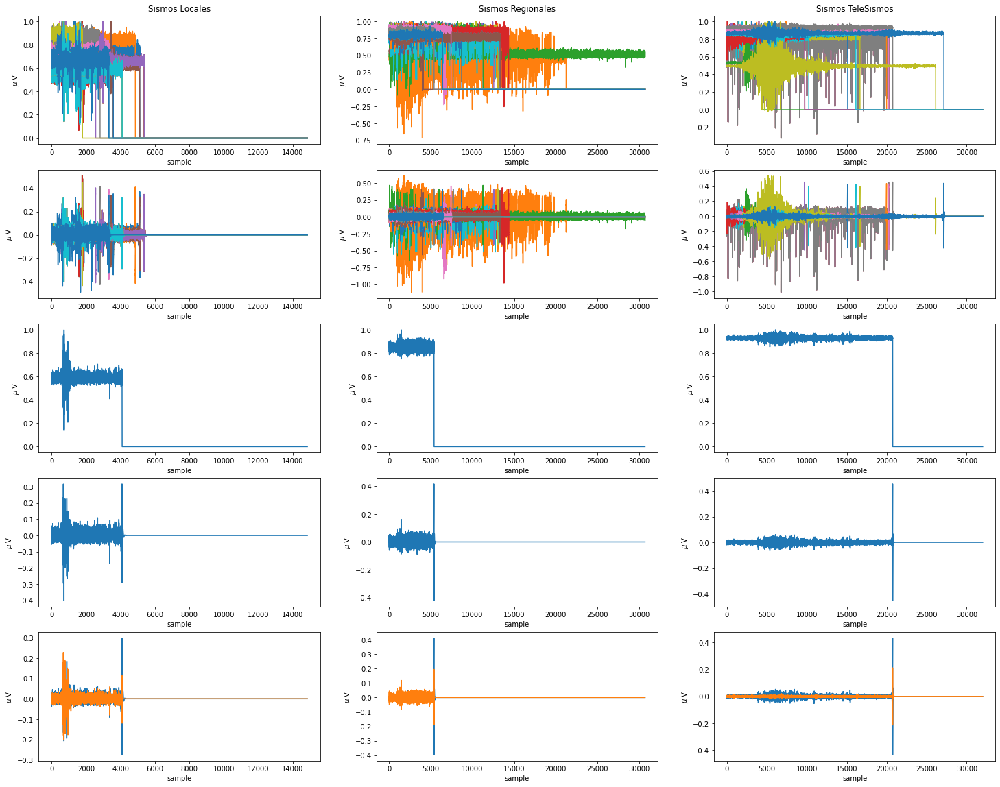

In [10]:
n=17
G=2
M_TOTAL, g, local, Regional, TeleSis= gruposSingulares(n, G)
newlist=[local,Regional,TeleSis]
graficar(newlist)

###**3.1.2. Para 3 grupos y la muestra n de las señales**

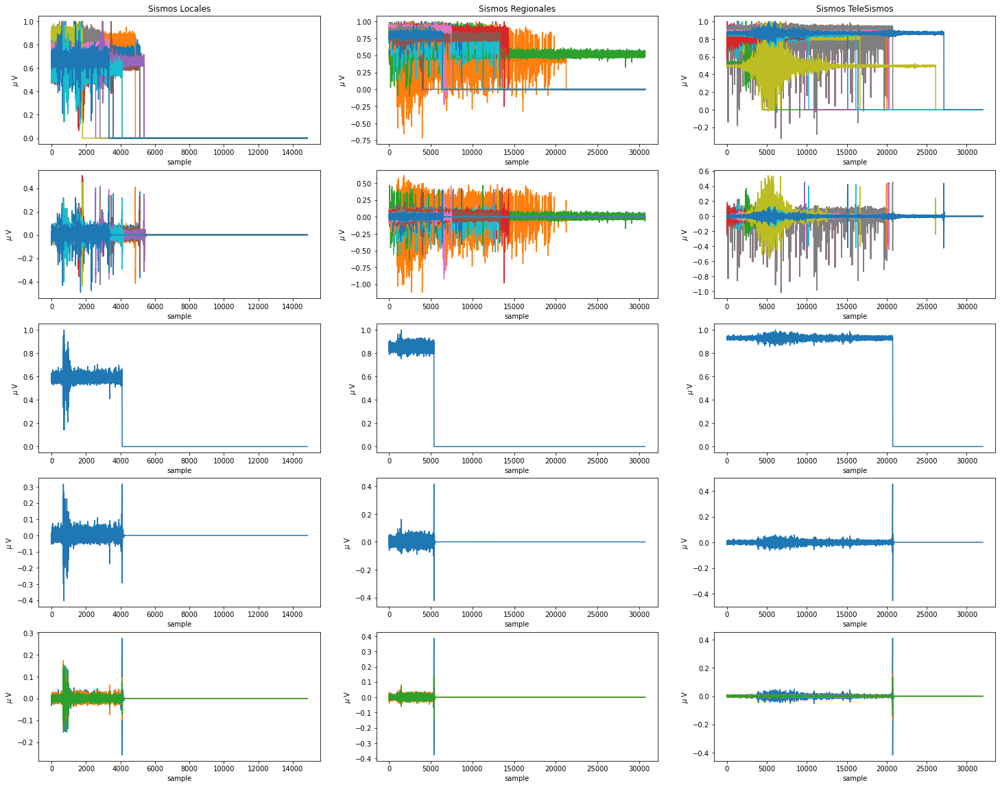

In [11]:
n=17
G=3
M_TOTAL, g, local, Regional, TeleSis= gruposSingulares(n, G)
newlist=[local,Regional,TeleSis]
graficar(newlist)

###**3.1.3. Para 4 grupos y la muestra n de las señales**



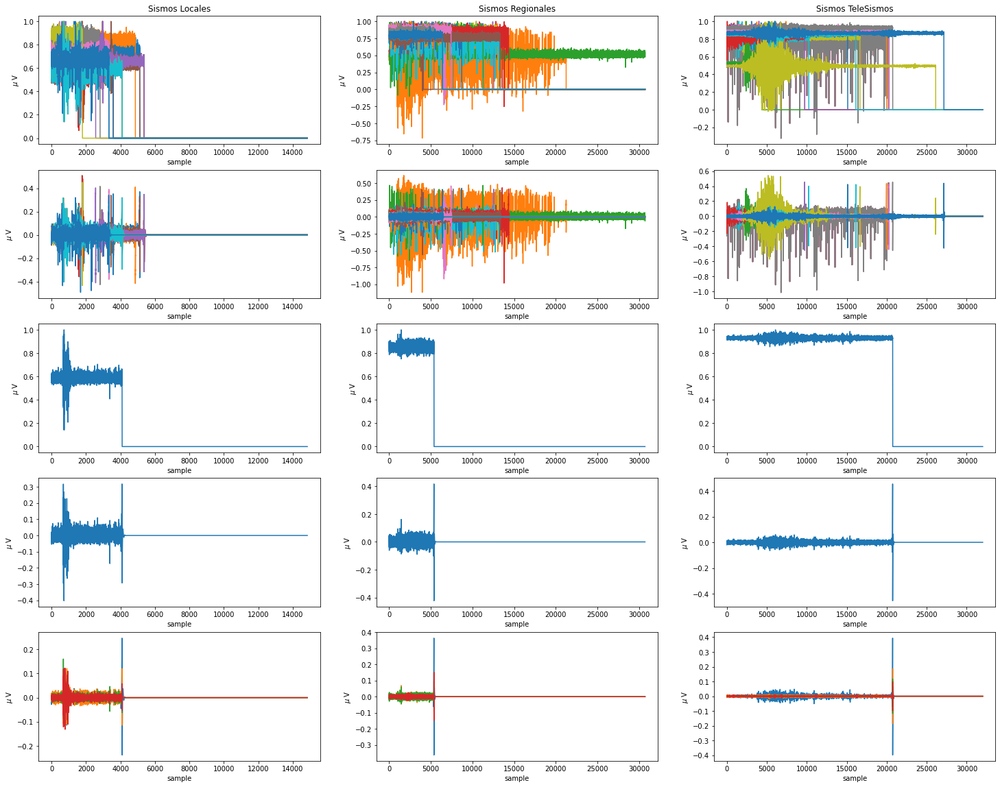

In [12]:
n=17
G=4
M_TOTAL, g, local, Regional, TeleSis= gruposSingulares(n, G)
newlist=[local,Regional,TeleSis]
graficar(newlist)

##**3.2. Espectrogramas Para los G grupos.**

###**3.2.1. Para 2 grupos y la muestra n de las señales**

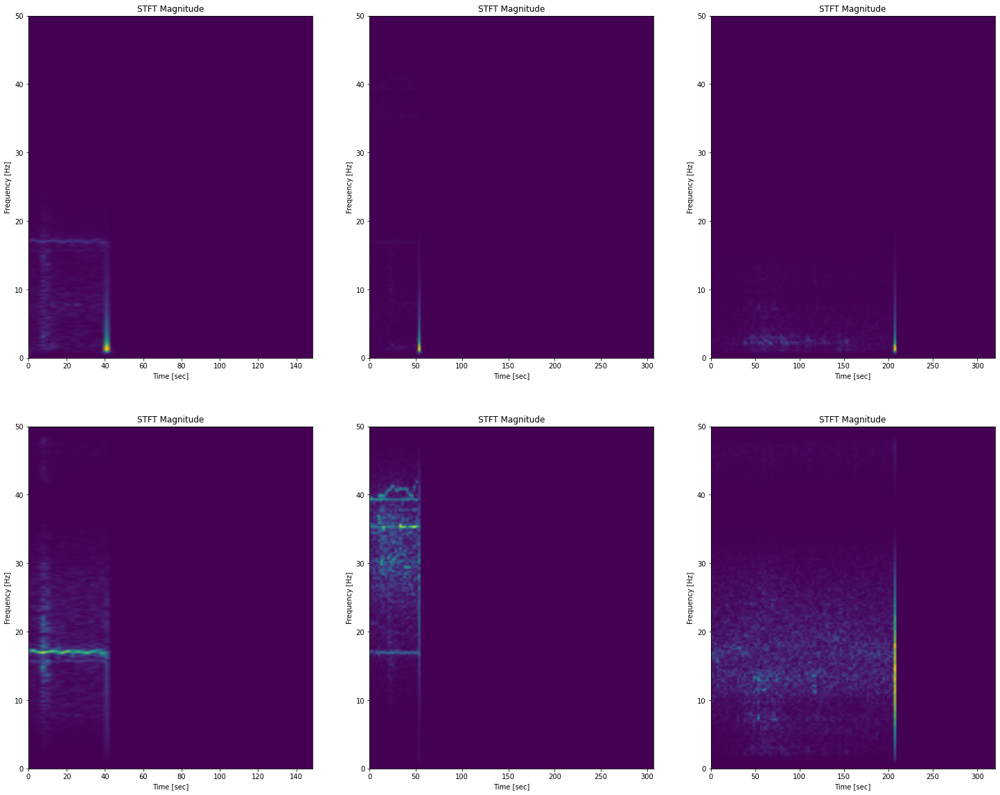

In [13]:
G=2
Graf_Spect(newlist,G)

###**3.2.2. Para 3 grupos y la muestra n de las señales**

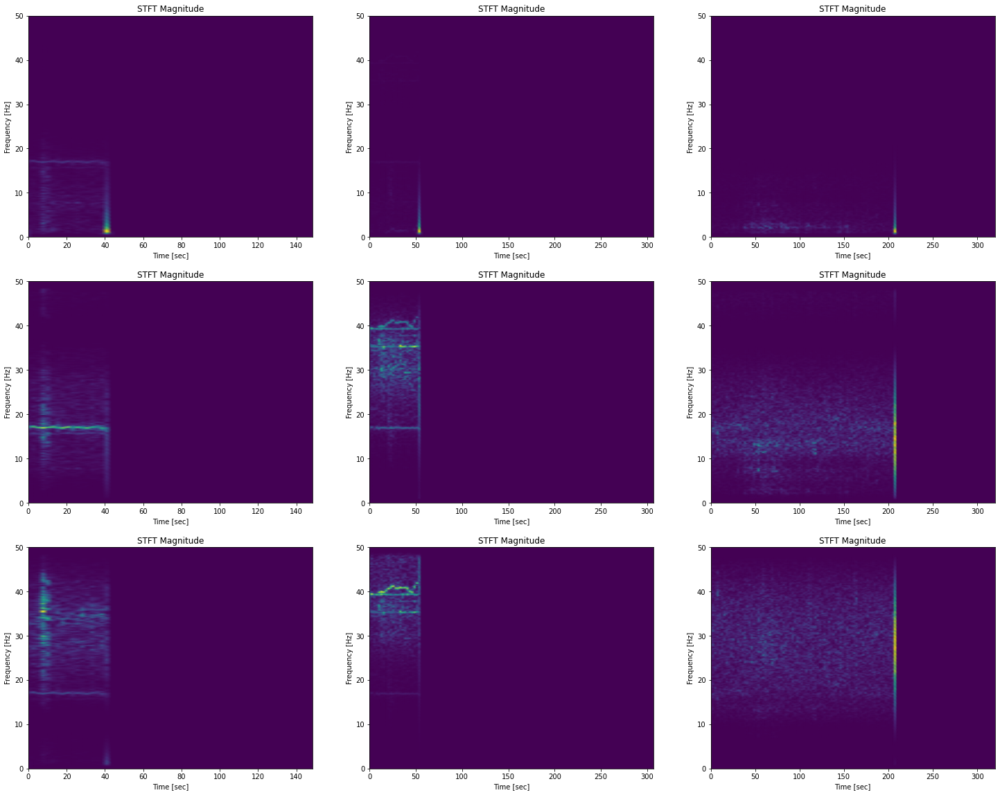

In [14]:
G=3
Graf_Spect(newlist,G)

###**3.2.3. Para 3 grupos y la muestra n de las señales**

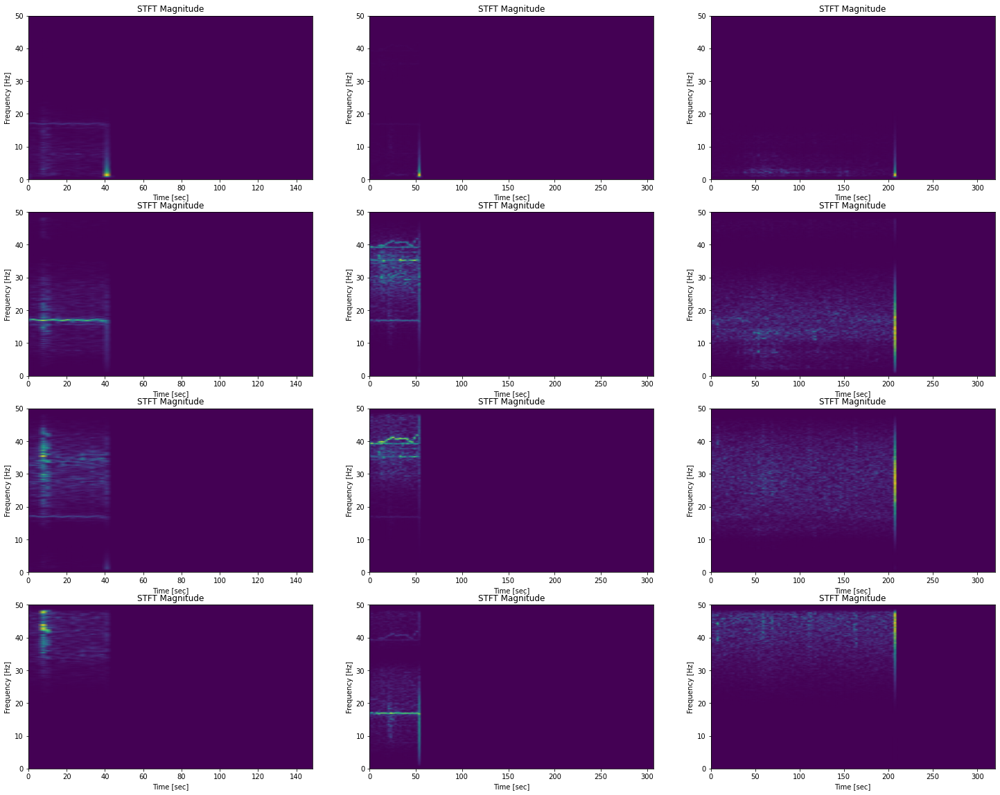

In [15]:
G=4
Graf_Spect(newlist,G)

##**3.3. ANALISIS:**

* Podemos notar en el espectrograma medida que se aumentan los grupos, la intensidad para los sismos locales y los telesismos empieza a tener una mayor distribubion en las frecuencias mayores.
* Los telesismos, como podemos ver, posse un mayor rango de frecuencias donde enontramos maximos de intensidad
* Para los sismos reginales al ver el espectrograma podemos notar que la duracion de sus maximos a comparacion de los otos 2 sismos tienden tener mayor duracion.
* Los telesismos son los que presentan la menor duracion del maximo de intensidad.


# **4. Gráficas en tablas Pandas**


##**4.1. Para grupos con G=2.**

In [16]:
Matrix, g,a,b,c = gruposSingulares(17,2)

df = pd.DataFrame(Matrix,columns=['Energia_SSA1','Energia_SSA2','Potencia1','Potencia2','f1','f2','v1','v2','px1','px2','media1','media2','pmin1','pmin2'])

Tiposismo = etiquetaS()

df['Tiposismo'] = Tiposismo

# Carga del Dataframe
print(df.shape)

# Impresión del Dataframe
df

(63, 15)


,Energia_SSA1,Energia_SSA2,Potencia1,Potencia2,f1,f2,v1,v2,px1,px2,media1,media2,pmin1,pmin2,Tiposismo
0,0.042957,0.022747,-30.277747,-41.816426,1.367188,36.132812,225.287679,139.727431,-30.277747,-41.816426,-58.471462,-59.476424,-2113.024885,-2190.744797,Local
1,0.035959,0.016493,-29.196945,-44.309555,1.367188,39.257812,224.492158,99.203595,-29.196945,-44.309555,-58.450258,-59.747333,-2164.631848,-2229.062897,Local
2,0.031051,0.021705,-37.029446,-33.444941,40.625000,1.367188,175.809454,143.494281,-37.029446,-33.444941,-56.068446,-54.831158,-2495.076003,-2448.032362,Local
3,0.031051,0.021705,-37.029446,-33.444941,40.625000,1.367188,175.809454,143.494281,-37.029446,-33.444941,-56.068446,-54.831158,-2495.076003,-2448.032362,Local
4,0.032403,0.010162,-29.296484,-40.505017,1.367188,44.921875,235.374832,97.938793,-29.296484,-40.505017,-59.394037,-60.142762,-2668.600102,-2704.703064,Local
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,0.065861,0.001794,-28.732854,-54.498508,1.367188,41.992188,346.057172,144.863869,-28.732854,-54.498508,-61.792817,-63.325420,-2536.698188,-2603.679060,Telesismo
59,0.060048,0.002981,-28.306815,-54.174877,1.367188,44.531250,336.603333,99.974077,-28.306815,-54.174877,-61.295477,-62.342794,-2442.863350,-2489.938416,Telesismo
60,1.432912,0.002925,-16.102681,-50.633132,2.343750,13.281250,467.497641,62.058283,-16.102681,-50.633132,-62.305765,-63.502564,-1316.576590,-1387.341794,Telesismo
61,0.073512,0.002279,-29.033748,-54.524374,1.367188,43.945312,354.404736,121.784646,-29.033748,-54.524374,-62.129585,-63.257295,-3391.053679,-3455.069200,Telesismo


## **4.2. Para grupos con G=3.**

In [17]:
Matrix1, g, a,b,c = gruposSingulares(17,3)

df1 = pd.DataFrame(Matrix1,columns=['Energia_SSA1','Energia_SSA2','Energia_SSA3','Potencia1','Potencia2','Potencia3','f1','f2','f3','v1','v2','v3','px1','px2','px3','media1','media2','media3','pmin1','pmin2','pmin3'])

Tiposismo = etiquetaS()

df1['Tiposismo'] = Tiposismo

# Carga del Dataframe
print(df1.shape)

# Impresión del Dataframe
df1

(63, 22)


,Energia_SSA1,Energia_SSA2,Energia_SSA3,Potencia1,Potencia2,Potencia3,f1,f2,f3,v1,v2,v3,px1,px2,px3,media1,media2,media3,pmin1,pmin2,pmin3,Tiposismo
0,0.027822,0.018897,0.010837,-30.828792,-39.142705,-43.765537,1.367188,23.632812,47.656250,368.911636,85.571972,203.155141,-30.828792,-39.142705,-43.765537,-67.237070,-60.847800,-65.805184,-2113.563224,-2173.415634,-2138.051640,Local
1,0.030210,0.007893,0.008637,-29.230196,-46.065243,-46.239170,1.367188,29.296875,39.257812,299.233392,126.174162,331.883139,-29.230196,-46.065243,-46.239170,-65.839684,-61.996654,-70.814662,-2164.652793,-2216.515912,-2227.029127,Local
2,0.019523,0.010565,0.014120,-38.264078,-42.663032,-33.911191,40.625000,29.687500,1.367188,275.386840,130.966951,268.917954,-38.264078,-42.663032,-33.911191,-63.946180,-58.290030,-63.823958,-2480.448398,-2488.106165,-2465.009438,Local
3,0.019523,0.010565,0.014120,-38.264078,-42.663032,-33.911191,40.625000,29.687500,1.367188,275.386840,130.966951,268.917954,-38.264078,-42.663032,-33.911191,-63.946180,-58.290030,-63.823958,-2480.448398,-2488.106165,-2465.009438,Local
4,0.028790,0.006040,0.003329,-29.327705,-41.869774,-48.031176,1.367188,44.921875,16.601562,319.882250,248.259773,194.128576,-29.327705,-41.869774,-48.031176,-66.295521,-69.023331,-63.669502,-2668.781495,-2718.663998,-2698.179915,Local
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,0.062020,0.001769,0.000849,-28.762252,-54.212410,-55.926135,1.367188,18.164062,42.968750,451.242719,171.056927,436.482295,-28.762252,-54.212410,-55.926135,-69.407716,-64.966601,-75.848852,-2536.710356,-2592.533759,-2609.375062,Telesismo
59,0.055466,0.002484,0.001511,-28.337839,-53.226524,-55.327430,1.367188,17.968750,44.531250,385.870296,120.354945,367.130623,-28.337839,-53.226524,-55.327430,-67.999610,-63.788901,-74.412973,-2456.070061,-2482.969605,-2503.813721,Telesismo
60,1.372316,0.008018,0.000897,-16.178049,-43.670092,-60.486087,2.343750,13.281250,45.117188,668.348791,310.066834,208.309857,-16.178049,-43.670092,-60.486087,-70.360823,-66.845210,-75.670067,-1316.585512,-1374.387139,-1407.179926,Telesismo
61,0.069293,0.001942,0.001147,-29.062758,-54.060974,-55.766477,1.367188,13.671875,45.898438,410.986693,132.412128,386.599103,-29.062758,-54.060974,-55.766477,-69.036229,-64.662451,-75.297490,-3391.072230,-3441.605056,-3462.586540,Telesismo


## **4.3. Para grupos con G=4.**

In [18]:
Matrix2, g,a,b,c = gruposSingulares(17,4)

df2 = pd.DataFrame(Matrix2,columns=['Energia_SSA1','Energia_SSA2','Energia_SSA3','Energia_SSA4','Potencia1','Potencia2','Potencia3','Potencia4','f1','f2','f3','f4','v1','v2','v3','v4','px1','px2','px3','px4','media1','media2','media3','media4','pmin1','pmin2','pmin3','pmin4'])

Tiposismo = etiquetaS()

df2['Tiposismo'] = Tiposismo

# Carga del Dataframe
print(df2.shape)

# Impresión del Dataframe
df2

(63, 29)


,Energia_SSA1,Energia_SSA2,Energia_SSA3,Energia_SSA4,Potencia1,Potencia2,Potencia3,Potencia4,f1,f2,f3,f4,v1,v2,v3,v4,px1,px2,px3,px4,media1,media2,media3,media4,pmin1,pmin2,pmin3,pmin4,Tiposismo
0,0.024575,0.012438,0.010658,0.007042,-30.533246,-40.892302,-42.848502,-43.831126,1.367188,23.632812,23.632812,47.656250,262.699437,142.766635,222.048852,244.557259,-30.533246,-40.892302,-42.848502,-43.831126,-68.892227,-65.268388,-67.615660,-71.948473,-2113.234048,-2169.811700,-2145.992567,-2219.119787,Local
1,0.027088,0.005876,0.003622,0.002572,-29.325319,-46.888533,-50.432026,-52.377260,1.367188,29.296875,29.296875,47.265625,232.186085,164.245275,90.245472,79.488227,-29.325319,-46.888533,-50.432026,-52.377260,-66.556814,-66.059024,-63.613725,-64.990445,-2164.727097,-2207.625717,-2223.480184,-2217.684818,Local
2,0.009224,0.012262,0.008105,0.005188,-41.769146,-40.188027,-36.185518,-42.836998,37.109375,40.625000,1.367188,13.671875,146.034849,473.859394,336.783680,262.524366,-41.769146,-40.188027,-36.185518,-42.836998,-60.753119,-72.590241,-67.265521,-64.383547,-2459.812015,-2511.955492,-2467.922109,-2482.351583,Local
3,0.009224,0.012262,0.008105,0.005188,-41.769146,-40.188027,-36.185518,-42.836998,37.109375,40.625000,1.367188,13.671875,146.034849,473.859394,336.783680,262.524366,-41.769146,-40.188027,-36.185518,-42.836998,-60.753119,-72.590241,-67.265521,-64.383547,-2459.812015,-2511.955492,-2467.922109,-2482.351583,Local
4,0.026663,0.004696,0.002149,0.002324,-29.360821,-41.504954,-47.458401,-47.506692,1.367188,44.921875,16.601562,35.937500,307.317306,141.649622,234.281870,294.754254,-29.360821,-41.504954,-47.458401,-47.506692,-69.470631,-69.190427,-67.274413,-70.601454,-2669.063813,-2702.247451,-2695.176654,-2758.920514,Local
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,0.058683,0.002163,0.000707,0.000547,-28.802989,-51.410285,-56.969079,-56.535279,1.367188,12.695312,27.929688,45.312500,441.375651,305.474159,309.071389,531.377812,-28.802989,-51.410285,-56.969079,-56.535279,-73.193568,-69.993778,-73.185917,-84.465491,-2536.725328,-2587.430655,-2599.064516,-2616.636282,Telesismo
59,0.051770,0.002810,0.001074,0.001014,-28.380496,-51.675810,-56.635914,-56.019395,1.367188,14.453125,27.148438,44.531250,380.927992,217.910843,223.227762,413.617112,-28.380496,-51.675810,-56.635914,-56.019395,-71.717990,-68.235767,-71.569354,-82.124167,-2464.278985,-2477.258322,-2504.693863,-2505.753302,Telesismo
60,1.301975,0.018453,0.000781,0.000571,-16.284021,-40.369709,-56.805013,-61.494774,2.343750,11.132812,13.281250,45.117188,650.747358,369.071290,212.483855,363.383921,-16.284021,-40.369709,-56.805013,-61.494774,-73.768064,-70.142615,-74.154367,-84.848224,-1316.597783,-1369.480873,-1381.079496,-1411.615949,Telesismo
61,0.065599,0.002334,0.000813,0.000761,-29.103404,-50.788848,-57.548981,-56.366834,1.367188,13.085938,26.757812,45.898438,406.229892,247.800503,252.642059,452.746009,-29.103404,-50.788848,-57.548981,-56.366834,-72.813004,-69.374985,-72.683735,-83.425429,-3391.098438,-3436.143093,-3454.737915,-3485.464129,Telesismo


# **5. Gráficas estadísticas**

## **5.1. Gráficas estadísticas G=2.**

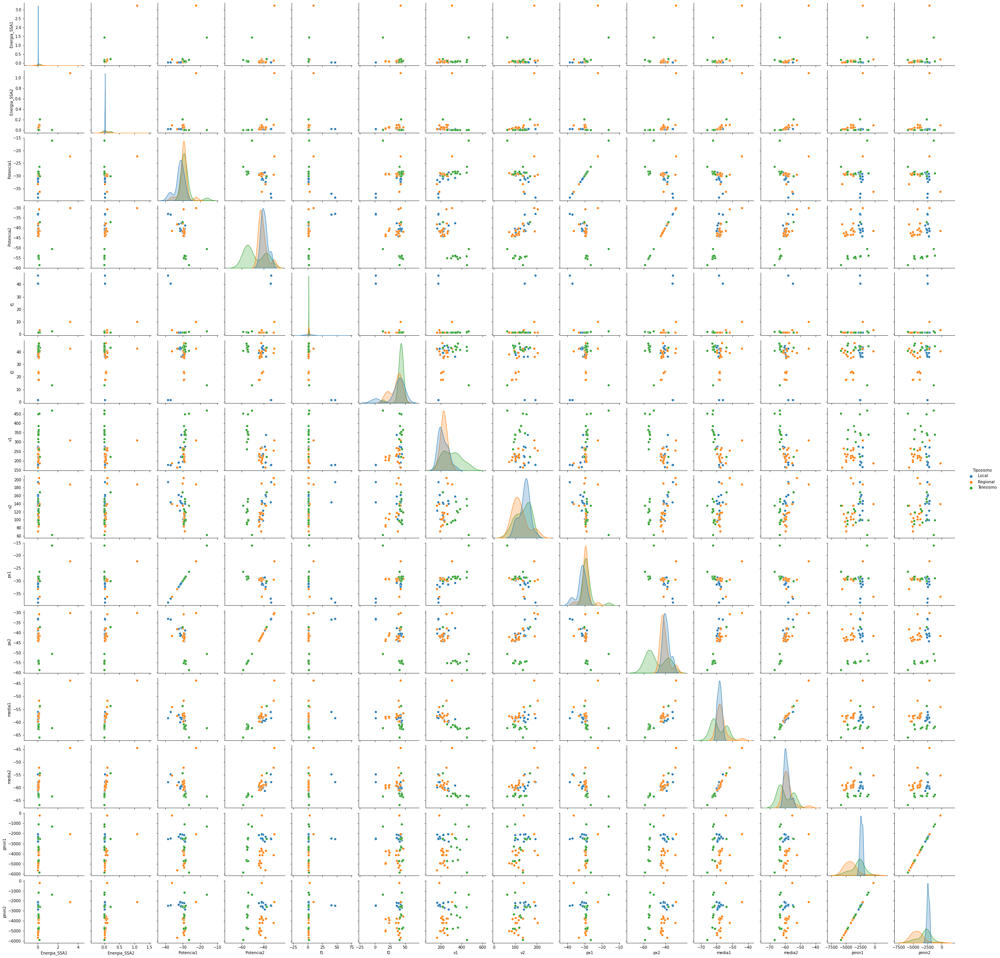

In [19]:
sns.pairplot(df, hue="Tiposismo")

## **5.2. Gráficas estadísticas G=3.**

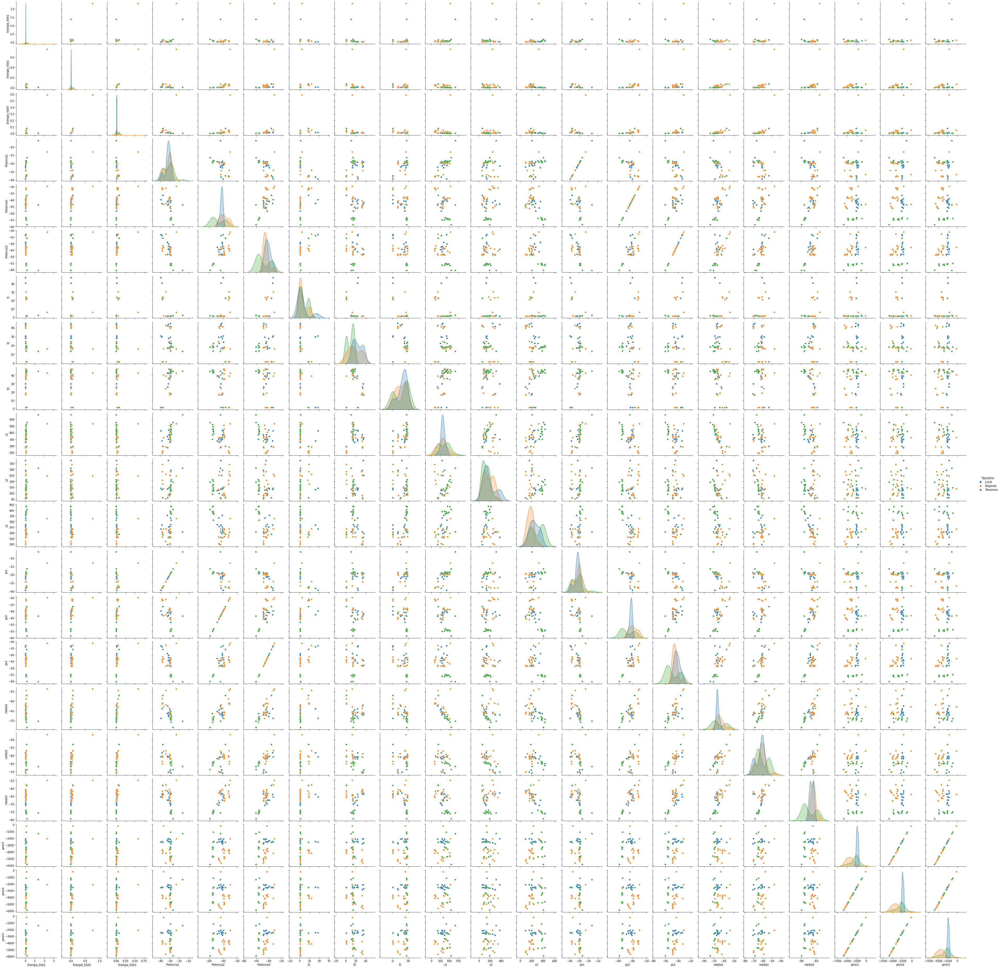

In [20]:
sns.pairplot(df1, hue="Tiposismo")

## **5.3. Gráficas estadísticas G=4.**

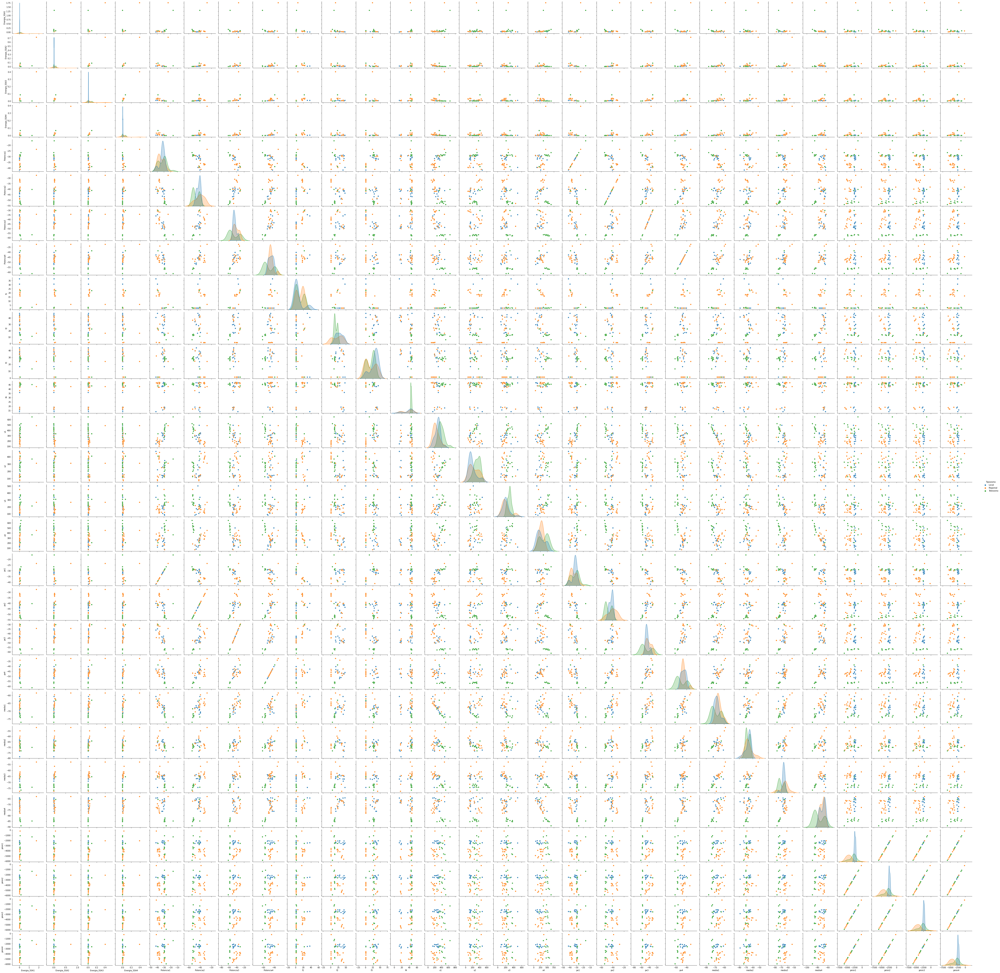

In [21]:
sns.pairplot(df2, hue="Tiposismo")

##**5.4. Caracteristicas mas relevaltes pra G=4**

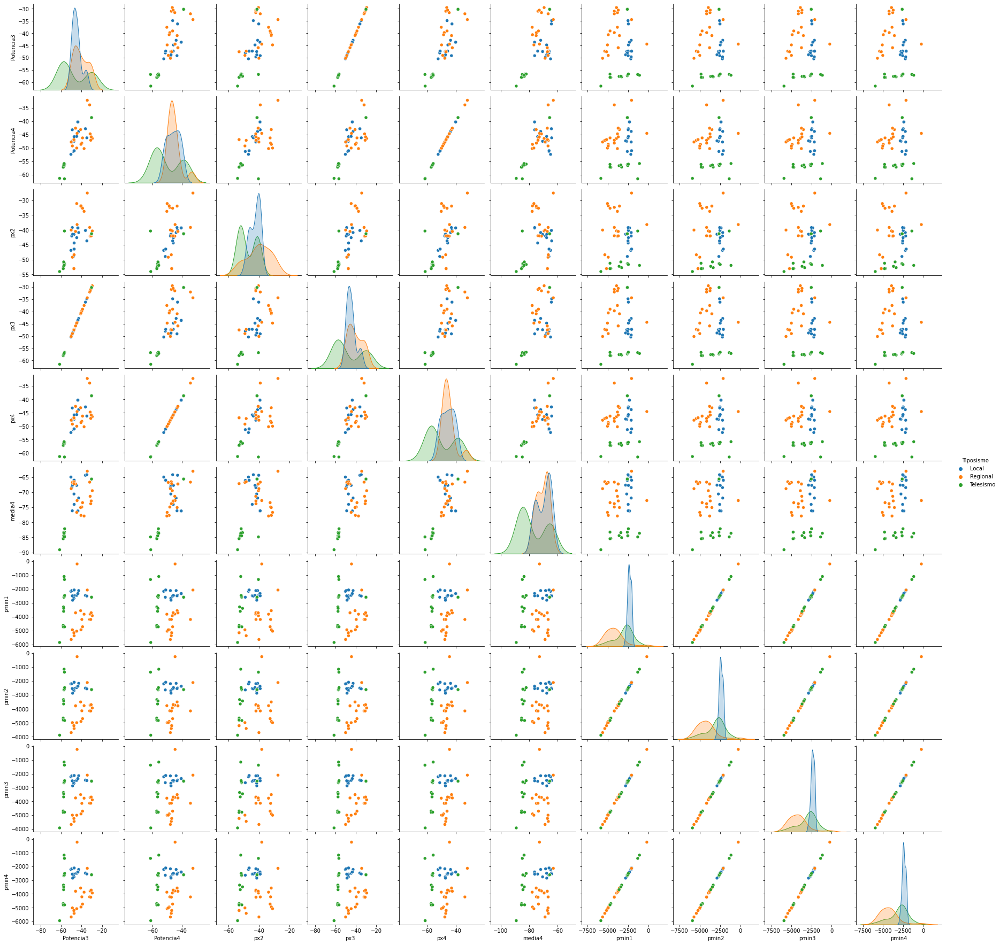

In [22]:
df3 =df2
df4=df3.iloc[:, [6,7,17,18,19,23,24,25,26,27,28]] 
#df4
sns.pairplot(df4, hue="Tiposismo")

##**5.5. ANALISIS:**


*   Podemos notar que al comparar todas las características en sus respectivas graficas aquellas que nos permite ver una mejor separación entre los tres tipos de sismos serían  la potencia, los máximos, la media y los mínimos, destacando que entre mayor sea el número de descomposición de la señal original en  señales singulares más notoria será la separación de los tres grupos, lo cual seria veneficio para un proceso de clasificación. 
* Para 4 grupos podemos notar que las caracteristicas mas importantes siguen siendo las mismas: las potencias mininimas, los maximos y la media.
* Podemos notar una tenedencia con la potencia minima que nos indica que los sismmos locales se encierran entre los regionales y los telesismos y tambien una notoria separacion entre los telesismos y los sismos regionales.
* Al revisar los maximos(px) notamos una tendencia de agrupamiento donde los simos locales se agrupan en la parte superior, los telesismos a lo largo del lado izquierdo y los regionales en la parte inferior derecha.  
* Podemos notar por estas caracteristicas tan relevantes que es posible mediante un algoritmo clasificar los sismos por su media, sus maximos y sus potencias minimas.
* Analisando la grafica de las caracteristicas mas relevantes podemos notar que una mayor separacion entre los grupos y portanto un mejor criterio para una clasificación son la comparación de las potencias minimas con las potencias maximas.


